In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from ipywidgets import interact, interactive, fixed, interact_manual 
import ipywidgets as widgets

import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, root_mean_squared_error
from sklearn.model_selection import RandomizedSearchCV, train_test_split

from io import StringIO
import geopandas as gpd
from shapely.ops import nearest_points
from shapely.geometry import Point, LineString
from shapely import distance

#import rioxarray
import folium
import math
import json

import branca.colormap as cm
from PIL import ImageColor

from numba import njit, prange

### Data import

In [2]:
df = pd.read_feather('data/sensornet_all.ftr').dropna(subset = ['distance','altitude','lasmax_dB','SEL_dB','duration','icao_type','tags']).loc[lambda d: d.icao_type.isin(['B738', 'E190', 'E75L', 'A320', 'A319', 'B737', 'B77W', 'B739', 'A333','B772','B77L','B744', 'B748'])]
print(df.shape)
df.head(1)

(1455445, 26)


,id,location_short,location_long,time,SELd,SELe,SELn,SELden,SEL,SEL_dB,...,callsign,type,tags,duration,hex_s,registration,icao_type,serial,operator,sensor
0,111529741,Aa,Aalsmeerderweg,1704109926,400042000.0,0.0,0.0,400042000,400042000,86.021054,...,KLM67F,Embraer ERJ 170-200 STD,Aalsmeerbaan36R_T,41,4855D1,PH-EXO,E75L,17000668,KLM Cityhopper,aalsmeer


In [3]:
df.columns

Index(['id', 'location_short', 'location_long', 'time', 'SELd', 'SELe', 'SELn',
       'SELden', 'SEL', 'SEL_dB', 'lasmax_dB', 'distance', 'altitude', 'label',
       'windspeed', 'winddirection', 'callsign', 'type', 'tags', 'duration',
       'hex_s', 'registration', 'icao_type', 'serial', 'operator', 'sensor'],
      dtype='object')

In [4]:
df['distance_x'] = np.sqrt(df['distance']**2 - df['altitude']**2)

df['distance2'] = df.distance**2

df['altitude_binned'] = df['altitude'].apply(lambda x: int(math.ceil(x / 100.0)) * 100)

df['distance_binned'] = df['distance'].apply(lambda x: int(math.ceil(x / 100.0)) * 100)

df['T_A'] = df.tags.apply(lambda x: x[-1])

df = df.loc[df['T_A'].isin(['T','L'])].copy()

In [23]:
df["distance_log"] = np.log(df["distance"])
df["SEL_dB_exp"] = np.exp(df["SEL_dB"] / 100)

# figures

In [8]:
def make_plot(location_long, tags, flight_type): # .loc[lambda d: d.location_long == location_long].loc[lambda d: d.tags == tags]
    fig = px.scatter(df.loc[lambda d: d.tags.str[-1] == flight_type].head(100000), x = 'distance_log', y = df.loc[lambda d: d.tags.str[-1] == flight_type].head(100000)['SEL_dB_exp'], color = 'icao_type', width = 800, height = 400, trendline="ols", opacity = 0.1)
    fig.show()

In [9]:
interactive(make_plot, location_long=df.location_long.unique(), tags=df.tags.unique(), flight_type = ["L", "T"])

interactive(children=(Dropdown(description='location_long', options=('Aalsmeerderweg', 'Darwinstraat', 'Uiterw…

In [12]:
def make_plot3(location_long, tags, column):
    fig = go.Figure()
    fig.add_trace(
        go.Histogram(
            x = df.loc[lambda d: d.location_long == location_long].loc[lambda d: d.tags == tags[:-1] + "T"][column],
            name = "Take-Off"
        )
    )
    fig.add_trace(
        go.Histogram(
            x = df.loc[lambda d: d.location_long == location_long].loc[lambda d: d.tags == tags[:-1] + "L"][column],
            name = "Landing"
        )
    )
    fig.update_layout(xaxis = {"title": column}, width = 800, height = 400)
    fig.show()

In [13]:
interactive(make_plot3, location_long = df.location_long.unique(), tags = df.tags.unique(), column = ['distance', 'distance_x', 'altitude'])

interactive(children=(Dropdown(description='location_long', options=('Aalsmeerderweg', 'Darwinstraat', 'Uiterw…

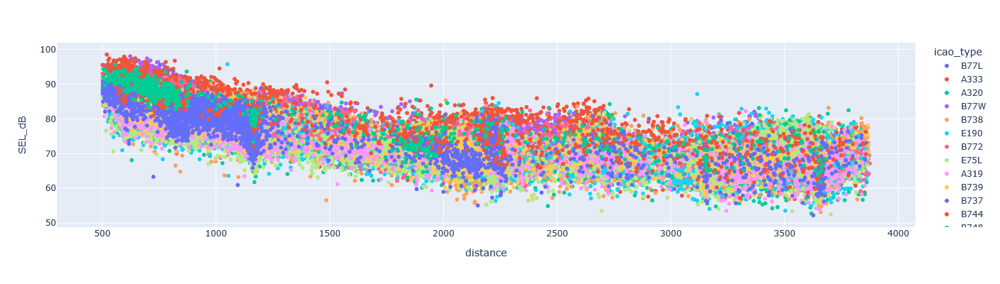

In [14]:
fig = px.scatter(df.loc[lambda d: d.altitude.between(500,600)], x='distance', y='SEL_dB', color = 'icao_type', width=800, height=400)
fig.show()

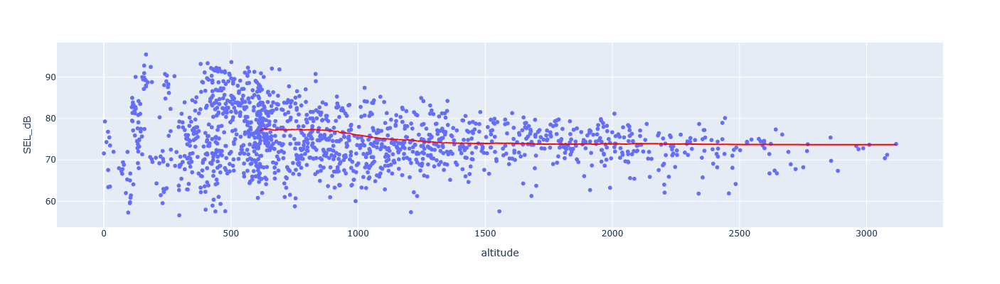

In [15]:
#fig = px.scatter(df.loc[lambda d: d.distance.between(1000,1100)], x='altitude', y='SEL_dB', color = 'icao_type', width=800, height=400)
fig = px.scatter(df.sample(frac=0.001), x='altitude', y='SEL_dB', width=800, height=400, trendline = 'rolling', 
                 trendline_options = {'window' : 500}, trendline_color_override  = 'red')
fig.show()

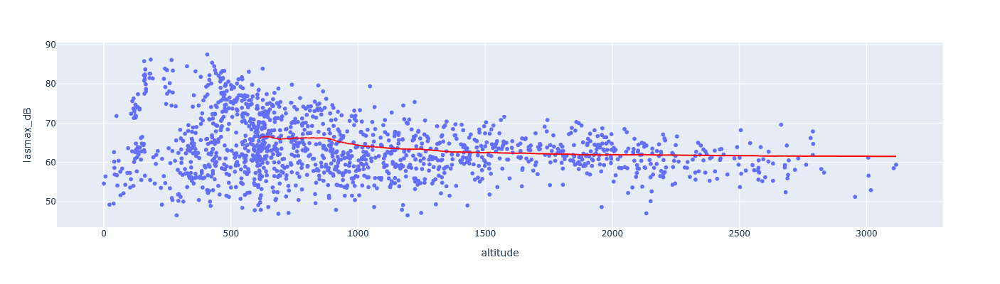

In [26]:
#fig = px.scatter(df.loc[lambda d: d.distance.between(1000,1100)], x='altitude', y='SEL_dB', color = 'icao_type', width=800, height=400)
fig = px.scatter(df.sample(frac=0.001), x='altitude', y='lasmax_dB', width=800, height=400, 
                 trendline = 'rolling', trendline_options = {'window' : 500}, trendline_color_override  = 'red')
fig.show()

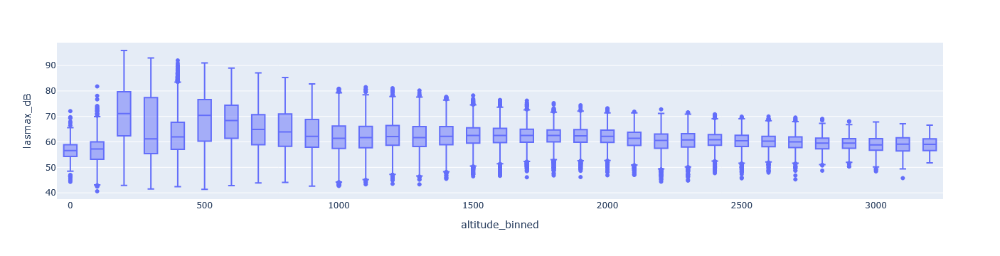

In [16]:
fig = px.box(df.sample(frac=0.1), x='altitude_binned', y='lasmax_dB')
fig.show()

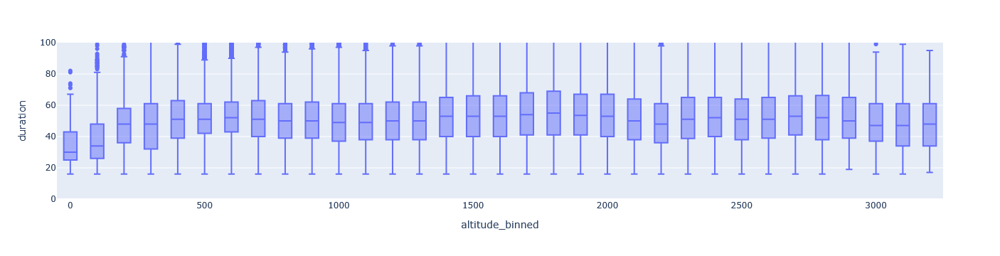

In [17]:
fig = px.box(df.sample(frac=0.1), x='altitude_binned', y='duration')
fig.update_layout(yaxis_range=[0,100])
fig.show()

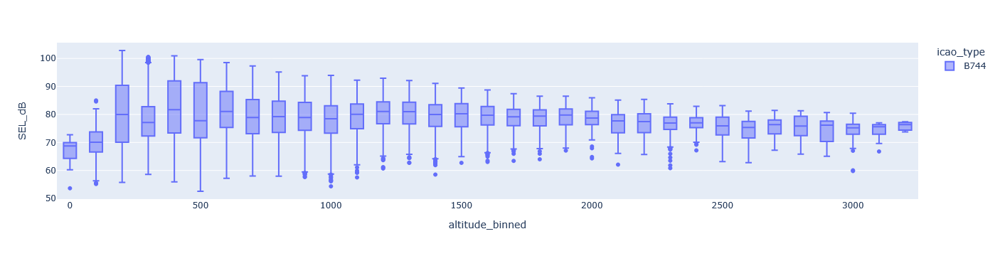

In [29]:
fig = px.box(df.loc[df.icao_type.isin(['B744','B789'])], x='altitude_binned', y='SEL_dB', color = 'icao_type')
fig.show()

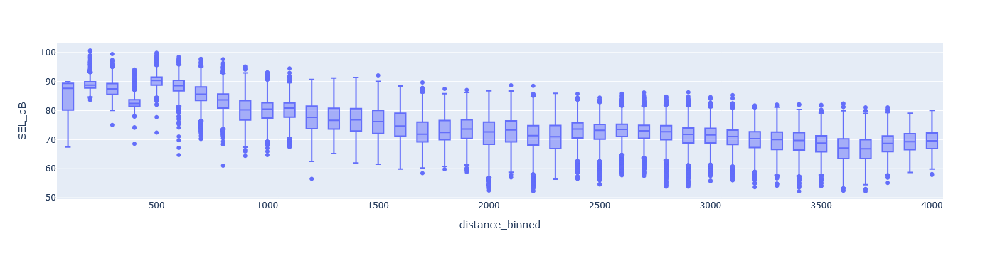

In [30]:
fig = px.box(df.sample(frac=0.1), x='distance_binned', y='SEL_dB')
fig.show()

In [18]:
df[['distance2','distance']].corr()

,distance2,distance
distance2,1.000000,0.974514
distance,0.974514,1.000000


# ML model

In [24]:
X = df[['distance_log', 'icao_type']]
y = df['SEL_dB_exp']

In [25]:
# Train model
# model = smf.ols('SEL_dB ~ distance_log : (C(T_A) + C(icao_type)) + altitude : (C(T_A) + C(icao_type)) + C(T_A) + C(icao_type)', data = pd.concat((y_train, X_train), axis = 1)).fit()
# model = smf.ols('y ~ distance_log : C(icao_type) + C(icao_type)', data = X).fit()
model = smf.ols('SEL_dB_exp ~ distance_log : C(icao_type) + C(icao_type)', data = pd.concat((y, X), axis = 1)).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             SEL_dB_exp   R-squared:                       0.602
Model:                            OLS   Adj. R-squared:                  0.602
Method:                 Least Squares   F-statistic:                 8.791e+04
Date:                Wed, 09 Jul 2025   Prob (F-statistic):               0.00
Time:                        16:59:36   Log-Likelihood:             1.3991e+06
No. Observations:             1455404   AIC:                        -2.798e+06
Df Residuals:                 1455378   BIC:                        -2.798e+06
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [26]:
hex_icao = df.groupby(["hex_s", "icao_type"]).size().reset_index()[["hex_s", "icao_type"]]
hex_icao_dict = {}
for link in hex_icao.iterrows():
    hex_icao_dict[link[1]["hex_s"]] = link[1]["icao_type"]
with open("hex_icao_links.json", 'w') as f:
    json.dump(hex_icao_dict, f)

In [27]:
icao_enc = {
    'A320': 0,
    'A333': 1,
    'B737': 2,
    'B738': 3,
    'B739': 4,
    'B744': 5,
    'B748': 6,
    'B772': 7,
    'B77L': 8,
    'B77W': 9,
    'E190': 10,
    'E75L': 11
}

with open("icao_enc.json", 'w') as f:
    json.dump(icao_enc, f)

In [28]:
lin_params = [
    [model.params.iloc[0]],                          # intercept
    [model.params.iloc[i] for i in range(1, 13)],    # C(icao_type)
    [model.params.iloc[i] for i in range(14, 26)]    # distance_log:C(icao_type)
]
lin_params

with open("lin_model_params.json", 'w') as f:
    json.dump(lin_params, f)

## Calculate single flight

In [29]:
#B738

csv = """
time,lat,lon,course,kts,mph,feet,rate,reporting facility
Wed 06:46:38 AM,52.2934,4.7482,↙ 238°,157,181,475, Level, FlightAware ADS-B (AMS / EHAM)
Wed 06:46:54 AM,52.2865,4.7307,↙ 238°,161,185,1125,1828 Climbing, FlightAware ADS-B (AMS / EHAM)
Wed 06:47:10 AM,52.2805,4.7147,↙ 238°,177,204,1450,1359 Climbing, FlightAware ADS-B (AMS / EHAM)
Wed 06:47:26 AM,52.2707,4.6937,↙ 226°,202,232,1850,1641 Climbing, FlightAware ADS-B (UDE / EHVK)
Wed 06:47:42 AM,52.2576,4.6854,↓ 187°,225,259,2325,2682 Climbing, FlightAware ADS-B (AMS / EHAM)
Wed 06:47:59 AM,52.2391,4.6927,↘ 152°,233,268,3325,3409 Climbing, FlightAware ADS-B (DHR / EHKD)
Wed 06:48:15 AM,52.2270,4.7120,↘ 125°,232,267,4200,2741 Climbing, FlightAware ADS-B (UDE / EHVK)
Wed 06:49:20 AM,52.1893,4.8201,↘ 120°,280,322,7025,2762 Climbing, FlightAware ADS-B (AMS / EHAM)
Wed 06:49:37 AM,52.1787,4.8512,↘ 114°,285,328,7975,3300 Climbing, FlightAware ADS-B (EHSE)
Wed 06:49:55 AM,52.1757,4.8899,→ 85°,289,333,8950,3083 Climbing, FlightAware ADS-B (EDLS)
Wed 06:50:13 AM,52.1818,4.9292,→ 75°,297,342,9825,3000 Climbing, FlightAware ADS-B (EHVB)
Wed 06:50:31 AM,52.1831,4.9667,→ 95°,302,348,10750,3032 Climbing, FlightAware ADS-B (EHVB)
Wed 06:51:00 AM,52.1758,5.0306,→ 101°,310,357,12200,2975 Climbing, FlightAware ADS-B (AMS / EHAM)
Wed 06:51:30 AM,52.1679,5.1041,→ 99°,317,365,13675,3000 Climbing, FlightAware ADS-B (AAH / EDKA)
Wed 06:51:47 AM,52.1636,5.1476,→ 99°,321,369,14550,2857 Climbing, FlightAware ADS-B (RTM / EHRD)
Wed 06:52:12 AM,52.1576,5.2047,→ 100°,326,375,15675,2830 Climbing, FlightAware ADS-B (EHDL)
Wed 06:52:31 AM,52.1528,5.2497,→ 100°,327,376,16625,1684 Climbing, FlightAware ADS-B (RTM / EHRD)
Wed 06:53:01 AM,52.1442,5.3260,→ 100°,363,418,17050,1250 Climbing, FlightAware ADS-B (GLZ / EHGR)
Wed 06:53:31 AM,52.1350,5.4090,→ 100°,386,444,17875,1851 Climbing, FlightAware ADS-B (EHHO)
Wed 06:53:48 AM,52.1294,5.4596,→ 100°,392,451,18500,2357 Climbing, FlightAware ADS-B (EHVB)
Wed 06:54:13 AM,52.1215,5.5312,→ 100°,397,457,19525,2455 Climbing, FlightAware ADS-B (EHDP)
Wed 06:54:43 AM,52.1117,5.6188,→ 100°,403,464,20750,2489 Climbing, FlightAware ADS-B (ENS / EHTW)
Wed 06:55:00 AM,52.1056,5.6723,→ 100°,405,466,21475,2284 Climbing, FlightAware ADS-B (UDE / EHVK)
Wed 06:55:50 AM,52.0887,5.8212,→ 101°,412,474,23300,2100 Climbing, FlightAware ADS-B (DUS / EDDL)
Wed 06:56:20 AM,52.0780,5.9138,→ 101°,419,482,24275,1900 Climbing, FlightAware ADS-B (DUS / EDDL)
Wed 06:56:50 AM,52.0674,6.0059,→ 101°,424,488,25200,1825 Climbing, FlightAware ADS-B (EDLA)
Wed 06:57:20 AM,52.0564,6.1001,→ 101°,430,495,26100,1775 Climbing, FlightAware ADS-B (EHHV)
Wed 06:57:50 AM,52.0450,6.1968,→ 102°,434,499,26975,1656 Climbing, FlightAware ADS-B (LEY / EHLE)
Wed 06:58:08 AM,52.0351,6.2515,→ 108°,435,501,27425,1438 Climbing, FlightAware ADS-B (ETWM)
"""
flight = pd.read_csv(StringIO(csv))
flight['altitude'] = flight.feet*0.3048
flight['time'] = pd.to_datetime(flight['time'], format = 'Wed %I:%M:%S %p')
flight.set_index('time', inplace = True)
flight = flight[['lat','lon','altitude']].resample('1s').mean().interpolate(method = 'cubic')
flight.head()

,lat,lon,altitude
time,,,
1900-01-01 06:46:38,52.293400,4.748200,144.780000
1900-01-01 06:46:39,52.292820,4.746797,163.257190
1900-01-01 06:46:40,52.292268,4.745450,180.729516
1900-01-01 06:46:41,52.291740,4.744158,197.238172
1900-01-01 06:46:42,52.291237,4.742916,212.824351


<Axes: xlabel='time'>

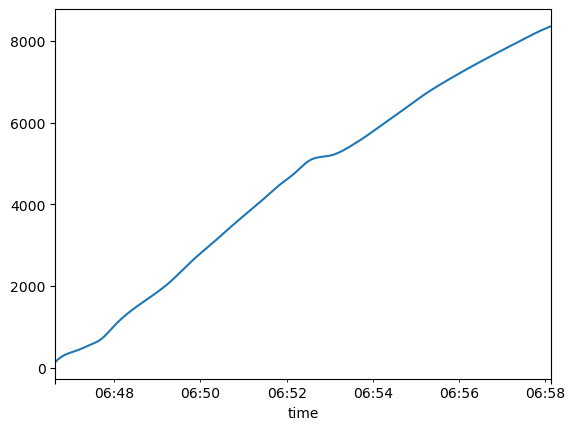

In [31]:
flight['altitude'].plot()

In [32]:
gdf = gpd.GeoDataFrame(
    flight, geometry = gpd.points_from_xy(flight.lon, flight.lat), crs="EPSG:4326"
).to_crs(28992)
gdf['x'] = gdf.geometry.apply(lambda p: p.coords[0][0])
gdf['y'] = gdf.geometry.apply(lambda p: p.coords[0][1])
gdf = gdf.reset_index(drop = True)

In [33]:
gdf[['x','y','geometry']].buffer(1000).explore()

### Numba method

In [41]:
@njit()
def linPredict(icao_type, distance, intercept, constants, coeffs):
    return np.log(intercept + constants[icao_type] + coeffs[icao_type] * np.log(distance)) * 100

In [42]:
@njit()
def HaversineSquaredDistance3D(pathPoint, point):
    r = 6_378_000 # in meters
    a = np.sin((pathPoint[0] - point[1]) / 360 * np.pi) ** 2 + np.sin((pathPoint[1] - point[0]) / 360 * np.pi) ** 2 * np.cos(pathPoint[0] / 180 * np.pi) * np.cos(pathPoint[1] / 180 * np.pi)
    surfaceDistance = 2 * r * np.arctan2(np.sqrt(a), np.sqrt(1 - a))
    return surfaceDistance ** 2 + pathPoint[2] ** 2

In [43]:
@njit()
def getClosestDistance(path, gridPoint):
    minDistance = np.inf
    for i in range(path.shape[0]):
        distance = HaversineSquaredDistance3D(path[i, :], gridPoint)
        if distance is not np.nan and distance < minDistance:
            minDistance = distance
            
    return minDistance ** 0.5

In [44]:
@njit(parallel = True)
def getNoisePath(path, icao_type, grid, intercept, constants, coeffs):
    noise = np.zeros(grid.shape[0])
    for i in range(grid.shape[0]):                                      # prange
        shortestDistance = getClosestDistance(path, grid[i, :])
        noise[i] = linPredict(icao_type, shortestDistance, intercept, constants, coeffs)
    return noise

In [45]:
x_left, x_right, y_left, y_right = (4.56144, 4.85158, 52.16262, 52.34405) # (108500-10000,108500.188+10000, 474150-10000,474150+10000)

Xpts = np.linspace(x_left, x_right, 40)
Ypts = np.linspace(y_left, y_right, 40)

X2D,Y2D = np.meshgrid(Ypts, Xpts)
test = np.column_stack((Y2D.ravel(),X2D.ravel()))

In [46]:
sound = getNoisePath(flight.values, icao_enc["E75L"], test, lin_params[0][0], lin_params[1], lin_params[2])
test = pd.DataFrame(test, columns = ['x', 'y'])
test["sound"] = sound

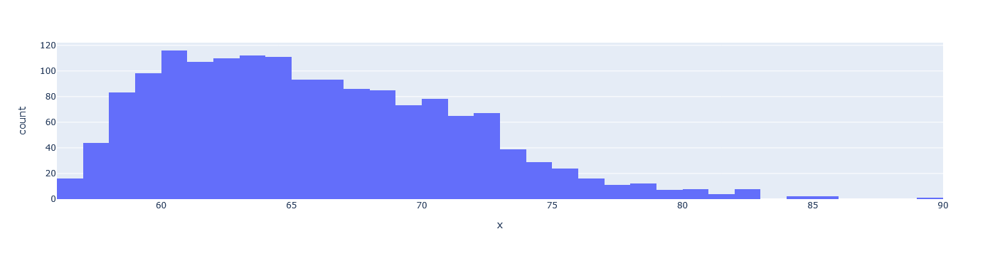

In [47]:
px.histogram(x = test['sound'])

In [48]:
def num_to_rgb(val, max_val = 3):
    i = (val * 255 / max_val);
    r = round(math.sin(0.024 * i + 0) * 127 + 128)
    g = round(math.sin(0.024 * i + 2) * 127 + 128)
    b = round(math.sin(0.024 * i + 4) * 127 + 128)
    return (r,g,b,0.5)

In [49]:
getClosestDistance(flight.values, [4.793553452083873, 52.26219721812179])

5255.590099982697

In [50]:
flight['altitude'].max()

np.float64(8359.140000000001)


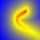

In [51]:
da = test.pivot(index = 'y', columns = 'x', values = 'sound').values
trans = gpd.GeoDataFrame({'geometry': [Point(x_left, y_left),Point(x_right,y_right)]}).geometry
bounds = [[trans.iloc[0].coords[0][1],trans.iloc[0].coords[0][0]],[trans.iloc[1].coords[0][1],trans.iloc[1].coords[0][0]]]

linear = cm.LinearColormap(["blue", "yellow", "red"], vmin = test["sound"].min(), vmax = test["sound"].max())

m = folium.Map([52, 5], zoom_start=10)

folium.raster_layers.ImageOverlay(
    image=np.flip(da, axis = 0),
    bounds=bounds,
    colormap= lambda x: ImageColor.getcolor(linear(x), 'RGBA'),
    opacity = 0.5
).add_to(m)

folium.GeoJson(gpd.GeoDataFrame({'geometry': [LineString(gdf['geometry'])]}, crs = 28992).to_crs(4326)).add_to(m)

m